In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/tabular-playground-series-jul-2021/sample_submission.csv
/kaggle/input/tabular-playground-series-jul-2021/train.csv
/kaggle/input/tabular-playground-series-jul-2021/test.csv


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV

In [3]:
df_train=pd.read_csv("../input/tabular-playground-series-jul-2021/train.csv")
df_test=pd.read_csv("../input/tabular-playground-series-jul-2021/test.csv")

# Data Exploration:

## 1. Description and Statistics:

In [4]:
print(f"The train dataset has {df_train.shape[0]} entries and {df_train.shape[1]} columns.\n")
print(f"The test dataset has {df_test.shape[0]} entries and {df_test.shape[1]} columns.")

The train dataset has 7111 entries and 12 columns.

The test dataset has 2247 entries and 9 columns.


In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7111 entries, 0 to 7110
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   date_time               7111 non-null   object 
 1   deg_C                   7111 non-null   float64
 2   relative_humidity       7111 non-null   float64
 3   absolute_humidity       7111 non-null   float64
 4   sensor_1                7111 non-null   float64
 5   sensor_2                7111 non-null   float64
 6   sensor_3                7111 non-null   float64
 7   sensor_4                7111 non-null   float64
 8   sensor_5                7111 non-null   float64
 9   target_carbon_monoxide  7111 non-null   float64
 10  target_benzene          7111 non-null   float64
 11  target_nitrogen_oxides  7111 non-null   float64
dtypes: float64(11), object(1)
memory usage: 666.8+ KB


There are 9 features and 3 target variables in the train set.

In [6]:
df_train.describe()

,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,target_carbon_monoxide,target_benzene,target_nitrogen_oxides
count,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000
mean,20.878034,47.561004,1.110309,1091.572100,938.064970,883.903305,1513.238349,998.335565,2.086219,10.237083,204.066784
std,7.937917,17.398731,0.398950,218.537554,281.978988,310.456355,350.180310,381.537695,1.447109,7.694426,193.927723
min,1.300000,8.900000,0.198800,620.300000,364.000000,310.600000,552.900000,242.700000,0.100000,0.100000,1.900000
25%,14.900000,33.700000,0.855900,930.250000,734.900000,681.050000,1320.350000,722.850000,1.000000,4.500000,76.450000
50%,20.700000,47.300000,1.083500,1060.500000,914.200000,827.800000,1513.100000,928.700000,1.700000,8.500000,141.000000
75%,25.800000,60.800000,1.404150,1215.800000,1124.100000,1008.850000,1720.400000,1224.700000,2.800000,14.200000,260.000000
max,46.100000,90.800000,2.231000,2088.300000,2302.600000,2567.400000,2913.800000,2594.600000,12.500000,63.700000,1472.300000


The above represents the basic statistics of the train set, which furnishes quantities like standard deviation, mean, etc... for every column.

## 2. Missing Values Handling:

In [7]:
df_train.isnull().sum()

date_time                 0
deg_C                     0
relative_humidity         0
absolute_humidity         0
sensor_1                  0
sensor_2                  0
sensor_3                  0
sensor_4                  0
sensor_5                  0
target_carbon_monoxide    0
target_benzene            0
target_nitrogen_oxides    0
dtype: int64

In [8]:
df_test.isnull().sum()

date_time            0
deg_C                0
relative_humidity    0
absolute_humidity    0
sensor_1             0
sensor_2             0
sensor_3             0
sensor_4             0
sensor_5             0
dtype: int64

There are no missing values in the train set and test set.

## 3. Outlier Detection:

Text(0.5, 0.98, 'Outlier Check')

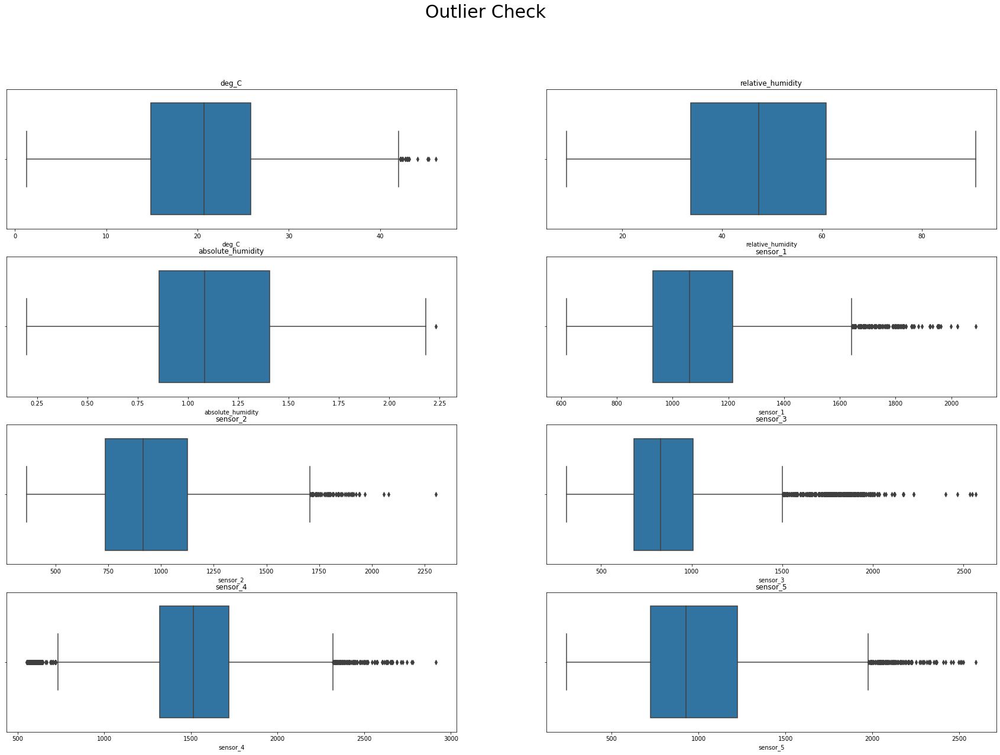

In [9]:
fig,ax=plt.subplots(4,2,figsize=(30,20))
sns.boxplot(x='deg_C', data=df_train,ax=ax[0,0])
ax[0,0].set_title('deg_C')
sns.boxplot(x='relative_humidity', data=df_train,ax=ax[0,1])
ax[0,1].set_title('relative_humidity')
sns.boxplot(x='absolute_humidity', data=df_train,ax=ax[1,0])
ax[1,0].set_title('absolute_humidity')
sns.boxplot(x='sensor_1', data=df_train,ax=ax[1,1])
ax[1,1].set_title('sensor_1')
sns.boxplot(x='sensor_2', data=df_train,ax=ax[2,0])
ax[2,0].set_title('sensor_2')
sns.boxplot(x='sensor_3', data=df_train,ax=ax[2,1])
ax[2,1].set_title('sensor_3')
sns.boxplot(x='sensor_4', data=df_train,ax=ax[3,0])
ax[3,0].set_title('sensor_4')
sns.boxplot(x='sensor_5', data=df_train,ax=ax[3,1])
ax[3,1].set_title('sensor_5')
fig.suptitle("Outlier Check",size=30)

As we can see from the above boxplots, all the "sensor" variables are experimentally determined quantities. So outliers present in them are called *NATURAL OUTLIERS* and cannot be removed.

In order to find out number of outliers in each column:

In [10]:
def outlier_no(df,col):
    me=df[col].mean()
    st=df[col].std()
    upper= 3*st + me
    lower= -3*st + me
    l=df[(df[col]<=upper) & (df[col]>=lower)]
    return l.shape[0]

In [11]:
cols=['deg_C', 'relative_humidity', 'absolute_humidity', 'sensor_1',
       'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5']
for i in cols:
    legit=outlier_no(df_train,i)
    print(i," has", str(df_train.shape[0]-legit))

deg_C  has 3
relative_humidity  has 0
absolute_humidity  has 0
sensor_1  has 59
sensor_2  has 34
sensor_3  has 173
sensor_4  has 25
sensor_5  has 49


## 4. Univariate Analysis:

Probability Distribution Curve:

<AxesSubplot:xlabel='sensor_5', ylabel='Density'>

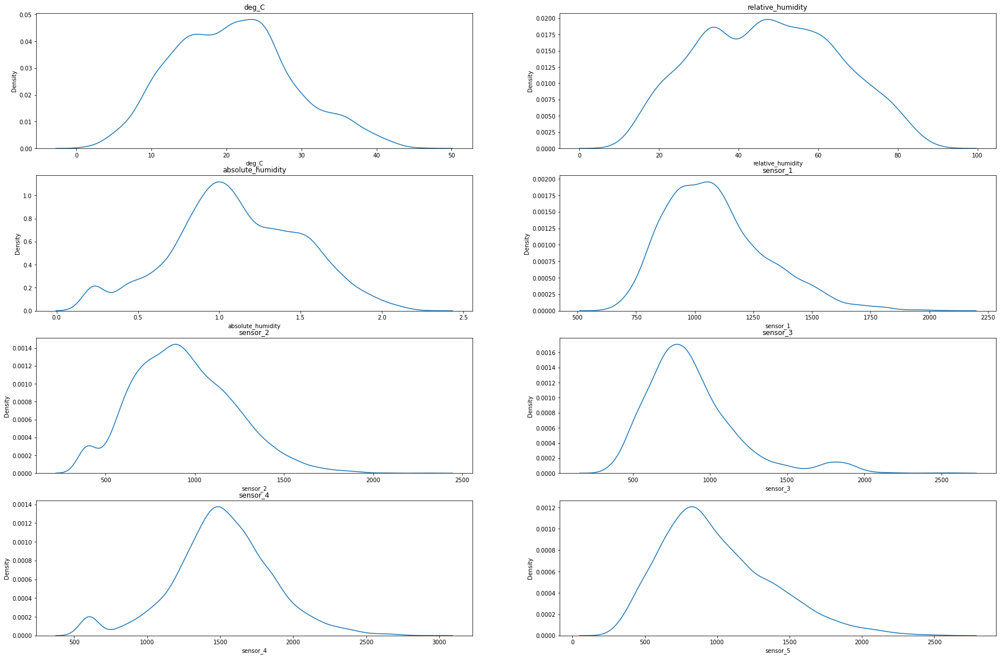

In [12]:
fig,ax=plt.subplots(4,2,figsize=(30,20))
sns.kdeplot(x='deg_C', data=df_train,ax=ax[0,0])
ax[0,0].set_title('deg_C')
sns.kdeplot(x='relative_humidity', data=df_train,ax=ax[0,1])
ax[0,1].set_title('relative_humidity')
sns.kdeplot(x='absolute_humidity', data=df_train,ax=ax[1,0])
ax[1,0].set_title('absolute_humidity')
sns.kdeplot(x='sensor_1', data=df_train,ax=ax[1,1])
ax[1,1].set_title('sensor_1')
sns.kdeplot(x='sensor_2', data=df_train,ax=ax[2,0])
ax[2,0].set_title('sensor_2')
sns.kdeplot(x='sensor_3', data=df_train,ax=ax[2,1])
ax[2,1].set_title('sensor_3')
sns.kdeplot(x='sensor_4', data=df_train,ax=ax[3,0])
ax[3,0].set_title('sensor_4')
sns.kdeplot(x='sensor_5', data=df_train,ax=ax[3,1])

# Basic Feature Additions:

In [13]:
df_train["date_time"]=pd.to_datetime(df_train["date_time"])
df_test["date_time"]=pd.to_datetime(df_test["date_time"])

Adding corresponding day,month,hour and day of week of each date/time entry.

In [14]:
df_train["month"]=df_train["date_time"].apply(lambda x:x.month)
df_test["month"]=df_test["date_time"].apply(lambda x:x.month)

df_train["day"]=df_train["date_time"].apply(lambda x:x.day)
df_test["day"]=df_test["date_time"].apply(lambda x:x.day)

df_train["hour"]=df_train["date_time"].apply(lambda x:x.hour)
df_test["hour"]=df_test["date_time"].apply(lambda x:x.hour)

df_train["dayofweek"]=df_train["date_time"].apply(lambda x:x.dayofweek)
df_test["dayofweek"]=df_test["date_time"].apply(lambda x:x.dayofweek)

Season ---->

         Spring--For the months MARCH,APRIL,MAY
         Summer--For the months JUNE,JULY,AUGUST
         Autumn--For the months SEPTEMBER,OCTOBER,NOVEMBER
         Winter--For the months DECEMBER,JANUARY,FEBRUARY
Time of Day ---->

         Morning is from 6 AM to 11:59 AM.(Sunrise typically occurs around 6 AM)
         Afternoon is from 12:00 PM to around 5:00 PM(17:00).
         Evening is from 5:01 PM(17:01) to 8 PM(20:00).
         Night is from sunset to sunrise, so from 8:01 PM(20:01) until 5:59 AM.

In [15]:
#Adding Season for train
for i in range(df_train.shape[0]):
    if df_train.loc[i,"month"] in [3,4,5]:
        df_train.loc[i,"Season"]="Spring"
    elif df_train.loc[i,"month"] in [6,7,8]:
        df_train.loc[i,"Season"]="Summer"
    elif df_train.loc[i,"month"] in [9,10,11]:
        df_train.loc[i,"Season"]="Autumn"
    elif df_train.loc[i,"month"] in [12,1,2]:
        df_train.loc[i,"Season"]="Winter"
        
#Adding Season for test
for i in range(df_test.shape[0]):
    if df_test.loc[i,"month"] in [3,4,5]:
        df_test.loc[i,"Season"]="Spring"
    elif df_test.loc[i,"month"] in [6,7,8]:
        df_test.loc[i,"Season"]="Summer"
    elif df_test.loc[i,"month"] in [9,10,11]:
        df_test.loc[i,"Season"]="Autumn"
    elif df_test.loc[i,"month"] in [12,1,2]:
        df_test.loc[i,"Season"]="Winter"


In [16]:
# Adding TimeofDay for train
for i in range(df_train.shape[0]):
    if df_train.loc[i,"hour"] in np.arange(6,12):   #np.arange(6,12)
        df_train.loc[i,"TimeofDay"]="Morning"
    elif df_train.loc[i,"hour"] in np.arange(12,18): #np.arange(12,18)
        df_train.loc[i,"TimeofDay"]="Afternoon"
    elif df_train.loc[i,"hour"] in np.arange(18,21): #np.arange(18,21)
        df_train.loc[i,"TimeofDay"]="Evening"
    else:
        df_train.loc[i,"TimeofDay"]="Night"

        
# Adding TimeofDay for test
for i in range(df_test.shape[0]):
    if df_test.loc[i,"hour"] in np.arange(6,12):   #np.arange(6,12)
        df_test.loc[i,"TimeofDay"]="Morning"
    elif df_test.loc[i,"hour"] in np.arange(12,18): #np.arange(12,18)
        df_test.loc[i,"TimeofDay"]="Afternoon"
    elif df_test.loc[i,"hour"] in np.arange(18,21): #np.arange(18,21)
        df_test.loc[i,"TimeofDay"]="Evening"
    else:
        df_test.loc[i,"TimeofDay"]="Night"


Weekday/Weekend :

In [17]:
def funct_week(n):
    if n in [0,1,2,3,4]:
        return "Weekday"
    else:
        return "Weekend"

In [18]:
df_train["dayofweek"]=df_train["dayofweek"].apply(lambda x:funct_week(x))
df_test["dayofweek"]=df_test["dayofweek"].apply(lambda x:funct_week(x))

Dew Temp

In [19]:
df_train["dewtemp"]=df_train["deg_C"]-((100-df_train["relative_humidity"])/5)
df_test["dewtemp"]=df_test["deg_C"]-((100-df_test["relative_humidity"])/5)

In [20]:
df_train.head()

,date_time,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,target_carbon_monoxide,target_benzene,target_nitrogen_oxides,month,day,hour,dayofweek,Season,TimeofDay,dewtemp
0,2010-03-10 18:00:00,13.1,46.0,0.7578,1387.2,1087.8,1056.0,1742.8,1293.4,2.5,12.0,167.7,3,10,18,Weekday,Spring,Evening,2.30
1,2010-03-10 19:00:00,13.2,45.3,0.7255,1279.1,888.2,1197.5,1449.9,1010.9,2.1,9.9,98.9,3,10,19,Weekday,Spring,Evening,2.26
2,2010-03-10 20:00:00,12.6,56.2,0.7502,1331.9,929.6,1060.2,1586.1,1117.0,2.2,9.2,127.1,3,10,20,Weekday,Spring,Evening,3.84
3,2010-03-10 21:00:00,11.0,62.4,0.7867,1321.0,929.0,1102.9,1536.5,1263.2,2.2,9.7,177.2,3,10,21,Weekday,Spring,Night,3.48
4,2010-03-10 22:00:00,11.9,59.0,0.7888,1272.0,852.7,1180.9,1415.5,1132.2,1.5,6.4,121.8,3,10,22,Weekday,Spring,Night,3.70


# Removing unwanted Features:

In [21]:
df_train.drop(["month","day"],axis=1,inplace=True)
df_test.drop(["month","day"],axis=1,inplace=True)

In [22]:
df_train.corr()

,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,target_carbon_monoxide,target_benzene,target_nitrogen_oxides,hour,dewtemp
deg_C,1.000000,-0.668002,0.445162,0.017513,0.133167,-0.145437,0.308202,-0.050567,-0.007503,0.109757,-0.205984,0.228959,0.908041
relative_humidity,-0.668002,1.000000,0.249013,0.093130,-0.035152,-0.102146,0.027002,0.126466,0.016589,-0.022895,0.178608,-0.289440,-0.294859
absolute_humidity,0.445162,0.249013,1.000000,0.105977,0.236894,-0.485445,0.567376,0.124945,-0.013756,0.186293,-0.101911,-0.029792,0.711779
sensor_1,0.017513,0.093130,0.105977,1.000000,0.811898,-0.592233,0.643191,0.860849,0.857215,0.842534,0.643044,0.320734,0.074910
sensor_2,0.133167,-0.035152,0.236894,0.811898,1.000000,-0.819334,0.812454,0.863464,0.821025,0.964440,0.604795,0.349729,0.151206
sensor_3,-0.145437,-0.102146,-0.485445,-0.592233,-0.819334,1.000000,-0.741439,-0.706006,-0.547567,-0.735545,-0.427622,-0.253043,-0.244245
sensor_4,0.308202,0.027002,0.567376,0.643191,0.812454,-0.741439,1.000000,0.641120,0.571412,0.783750,0.235662,0.208601,0.410947
sensor_5,-0.050567,0.126466,0.124945,0.860849,0.863464,-0.706006,0.641120,1.000000,0.834501,0.877662,0.708270,0.225866,0.006255
target_carbon_monoxide,-0.007503,0.016589,-0.013756,0.857215,0.821025,-0.547567,0.571412,0.834501,1.000000,0.881884,0.806099,0.361503,-0.000297
target_benzene,0.109757,-0.022895,0.186293,0.842534,0.964440,-0.735545,0.783750,0.877662,0.881884,1.000000,0.664235,0.321133,0.128046


# Visualizing the target variable:

Text(0.5, 1.0, 'target_nitrogen_oxides')

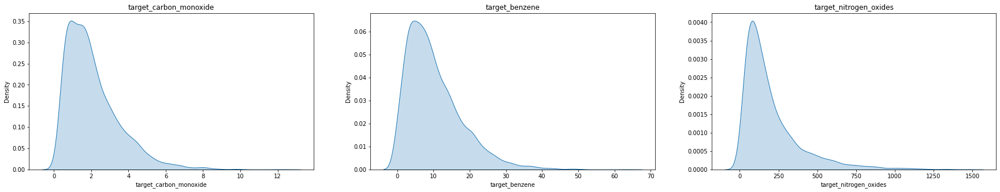

In [23]:
fig,ax=plt.subplots(1,3,figsize=(30,5))
sns.kdeplot(x=df_train["target_carbon_monoxide"],ax=ax[0],shade=True)
ax[0].set_title("target_carbon_monoxide")
sns.kdeplot(x=df_train["target_benzene"],ax=ax[1],shade=True)
ax[1].set_title("target_benzene")
sns.kdeplot(x=df_train["target_nitrogen_oxides"],ax=ax[2],shade=True)
ax[2].set_title("target_nitrogen_oxides")

Since all Target variables are Right-Skewed(Log-Normal), we apply LOG-TRANSFORMATION:

## Log Transformation of Target variables:

In [24]:
df_train["log_carbon_monoxide"]=np.log(df_train["target_carbon_monoxide"])
df_train["log_benzene"]=np.log(1+df_train["target_benzene"])
df_train["log_nitrogen_oxides"]=np.log(1+df_train["target_nitrogen_oxides"])

Text(0.5, 1.0, 'log_nitrogen_oxides')

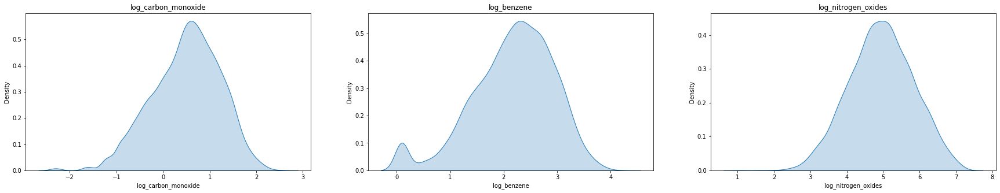

In [25]:
fig,ax=plt.subplots(1,3,figsize=(30,5))
sns.kdeplot(x=df_train["log_carbon_monoxide"],ax=ax[0],shade=True)
ax[0].set_title("log_carbon_monoxide")
sns.kdeplot(x=df_train["log_benzene"],ax=ax[1],shade=True)
ax[1].set_title("log_benzene")
sns.kdeplot(x=df_train["log_nitrogen_oxides"],ax=ax[2],shade=True)
ax[2].set_title("log_nitrogen_oxides")

Now Target variables almost look Normally Distributed. 

In [26]:
df_train.drop(columns=["target_carbon_monoxide","target_benzene","target_nitrogen_oxides"],inplace=True)

# Bivariate Analysis

## Time Series Analysis:

Categorisation based on "Season":

<AxesSubplot:xlabel='date_time', ylabel='deg_C'>

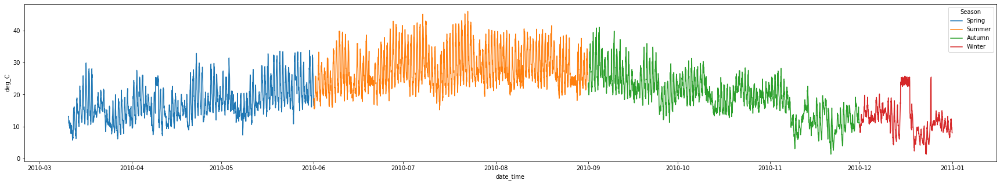

In [27]:
plt.figure(figsize=(30,5))
sns.lineplot(x="date_time",y="deg_C",data=df_train,hue="Season")

Text(0.5, 0.98, 'Time Series Analysis')

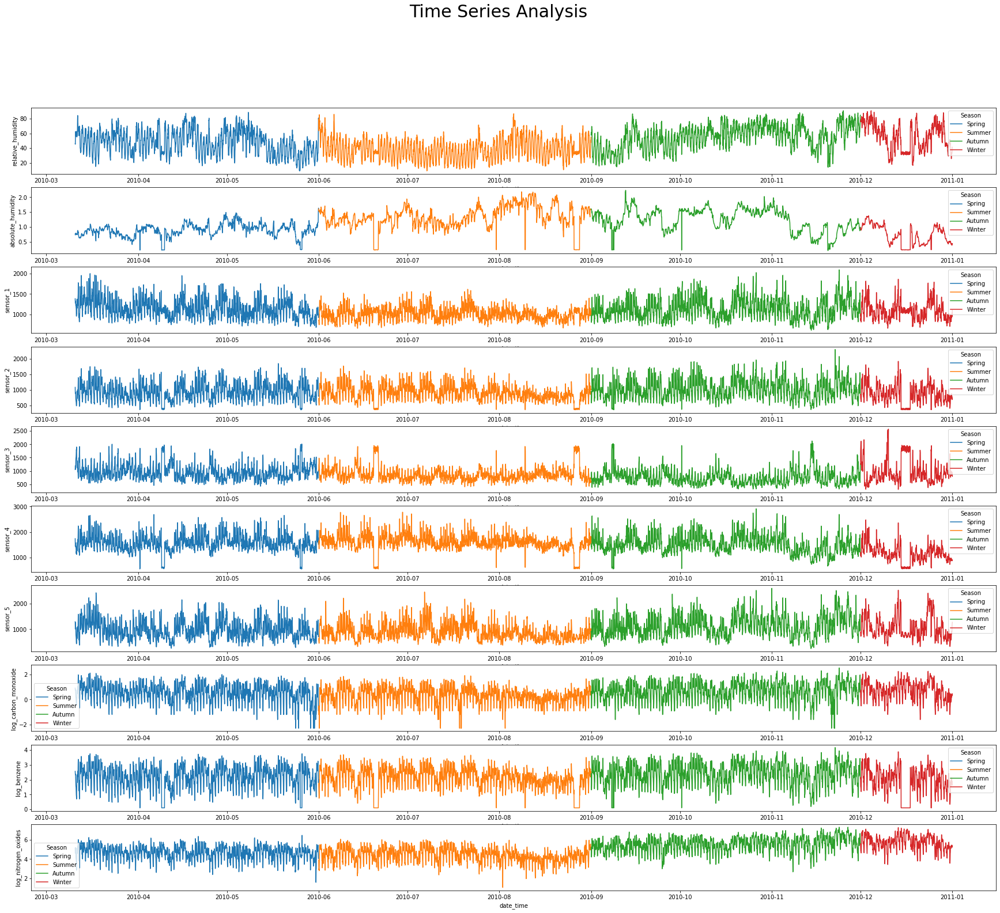

In [28]:
fig,ax=plt.subplots(10,1,figsize=(30,25))    #log_carbon_monoxide	log_benzene	log_nitrogen_oxides
sns.lineplot(x="date_time",y="relative_humidity",data=df_train,hue="Season",ax=ax[0])
sns.lineplot(x="date_time",y="absolute_humidity",data=df_train,hue="Season",ax=ax[1])
sns.lineplot(x="date_time",y="sensor_1",data=df_train,hue="Season",ax=ax[2])
sns.lineplot(x="date_time",y="sensor_2",data=df_train,hue="Season",ax=ax[3])
sns.lineplot(x="date_time",y="sensor_3",data=df_train,hue="Season",ax=ax[4])
sns.lineplot(x="date_time",y="sensor_4",data=df_train,hue="Season",ax=ax[5])
sns.lineplot(x="date_time",y="sensor_5",data=df_train,hue="Season",ax=ax[6])
sns.lineplot(x="date_time",y="log_carbon_monoxide",data=df_train,hue="Season",ax=ax[7])
sns.lineplot(x="date_time",y="log_benzene",data=df_train,hue="Season",ax=ax[8])
sns.lineplot(x="date_time",y="log_nitrogen_oxides",data=df_train,hue="Season",ax=ax[9])

plt.suptitle("Time Series Analysis",size=30)


Categorisation based on "TimeOfDay":

<AxesSubplot:xlabel='date_time', ylabel='deg_C'>

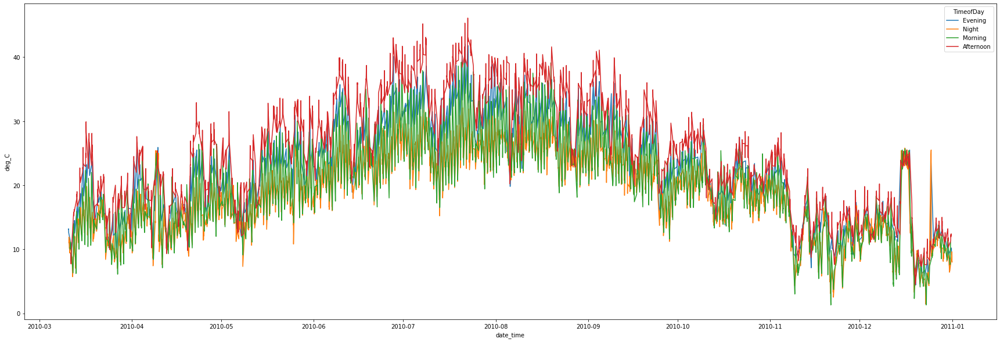

In [29]:
plt.figure(figsize=(30,10))
sns.lineplot(x="date_time",y="deg_C",data=df_train,hue="TimeofDay")

<AxesSubplot:xlabel='date_time', ylabel='log_nitrogen_oxides'>

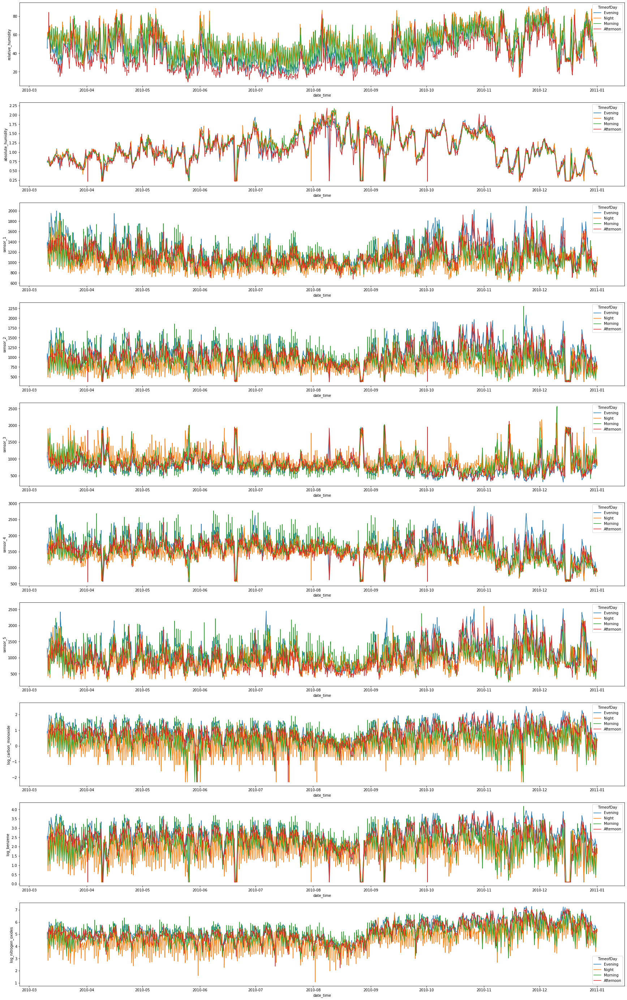

In [30]:
fig,ax=plt.subplots(10,1,figsize=(30,50))
sns.lineplot(x="date_time",y="relative_humidity",data=df_train,hue="TimeofDay",ax=ax[0])
sns.lineplot(x="date_time",y="absolute_humidity",data=df_train,hue="TimeofDay",ax=ax[1])
sns.lineplot(x="date_time",y="sensor_1",data=df_train,hue="TimeofDay",ax=ax[2])
sns.lineplot(x="date_time",y="sensor_2",data=df_train,hue="TimeofDay",ax=ax[3])
sns.lineplot(x="date_time",y="sensor_3",data=df_train,hue="TimeofDay",ax=ax[4])
sns.lineplot(x="date_time",y="sensor_4",data=df_train,hue="TimeofDay",ax=ax[5])
sns.lineplot(x="date_time",y="sensor_5",data=df_train,hue="TimeofDay",ax=ax[6])
sns.lineplot(x="date_time",y="log_carbon_monoxide",data=df_train,hue="TimeofDay",ax=ax[7])
sns.lineplot(x="date_time",y="log_benzene",data=df_train,hue="TimeofDay",ax=ax[8])
sns.lineplot(x="date_time",y="log_nitrogen_oxides",data=df_train,hue="TimeofDay",ax=ax[9])


## Pairplot Visualization:

In [31]:
df_train.columns

Index(['date_time', 'deg_C', 'relative_humidity', 'absolute_humidity',
       'sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5', 'hour',
       'dayofweek', 'Season', 'TimeofDay', 'dewtemp', 'log_carbon_monoxide',
       'log_benzene', 'log_nitrogen_oxides'],
      dtype='object')

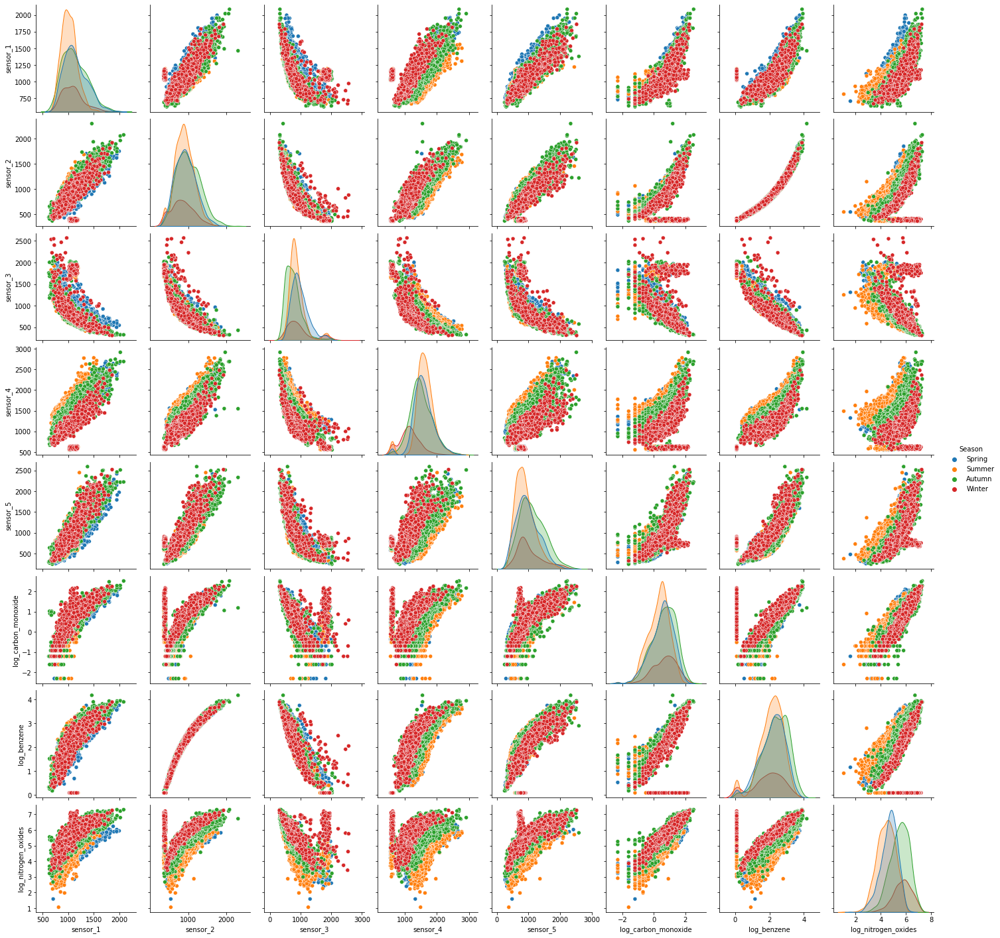

In [32]:
x=df_train[['sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5','log_carbon_monoxide','log_benzene', 'log_nitrogen_oxides','Season']]
sns.pairplot(x, hue ='Season')
plt.show()

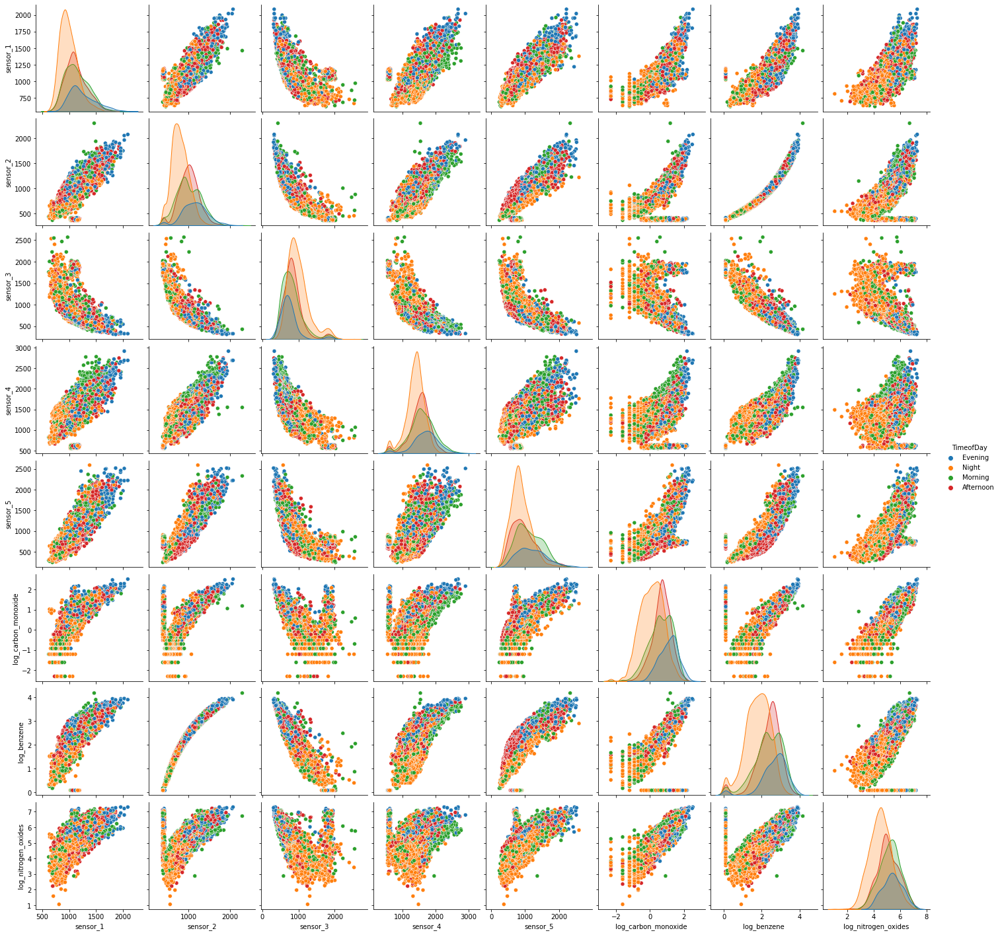

In [33]:
x=df_train[['sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5','log_carbon_monoxide','log_benzene', 'log_nitrogen_oxides','TimeofDay']]
sns.pairplot(x, hue ='TimeofDay')
plt.show()

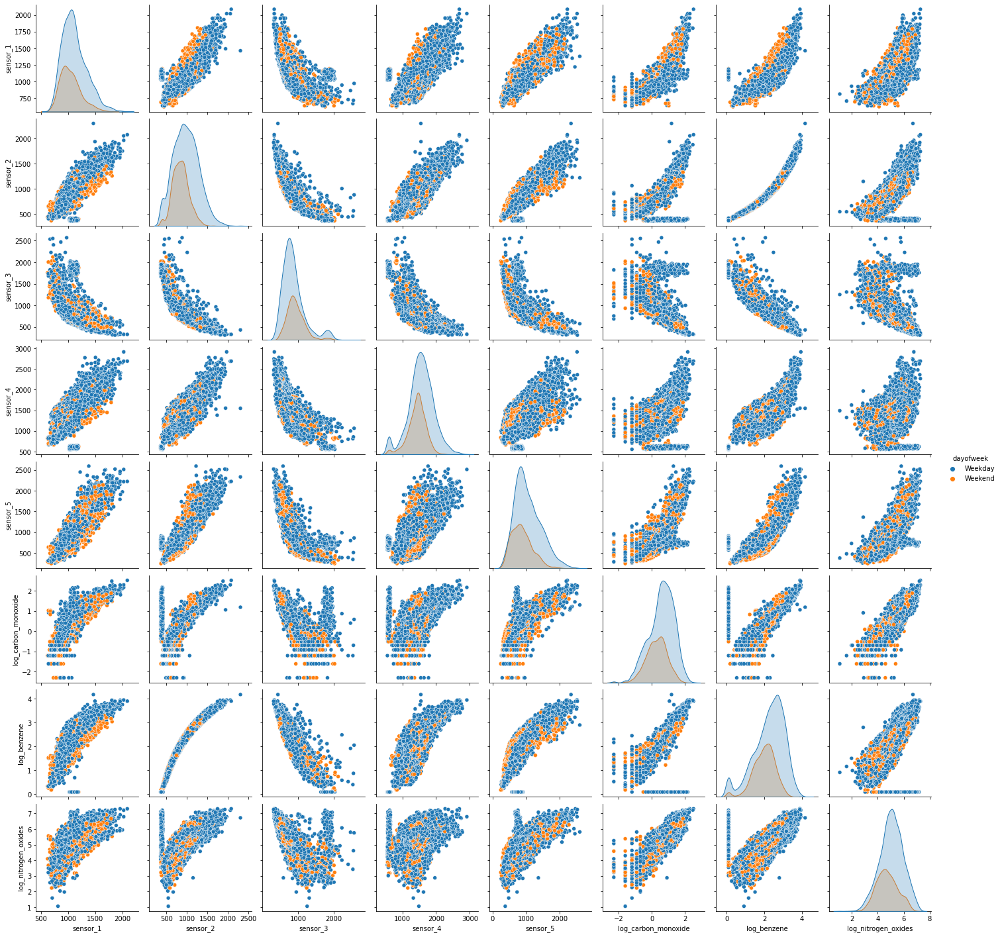

In [34]:
x=df_train[['sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5','log_carbon_monoxide','log_benzene', 'log_nitrogen_oxides','dayofweek']]
sns.pairplot(x, hue ='dayofweek')
plt.show()

# Label Encoding Categorical Variables:

In [35]:
X=df_train.drop(columns=["log_benzene","log_nitrogen_oxides","log_carbon_monoxide","date_time"],axis=1)
test=df_test.drop(["date_time"],axis=1)
y_CO=df_train["log_carbon_monoxide"]
y_C6H6=df_train["log_benzene"]
y_NO=df_train["log_nitrogen_oxides"]

In [36]:
le=LabelEncoder()
X["Season"]=le.fit_transform(X["Season"])
test["Season"]=le.transform(df_test["Season"])

In [37]:
le=LabelEncoder()
X["TimeofDay"]=le.fit_transform(X["TimeofDay"])
test["TimeofDay"]=le.transform(df_test["TimeofDay"])

In [38]:
le=LabelEncoder()
X["dayofweek"]=le.fit_transform(X["dayofweek"])
test["dayofweek"]=le.transform(df_test["dayofweek"])

In [39]:
X.head()

,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,hour,dayofweek,Season,TimeofDay,dewtemp
0,13.1,46.0,0.7578,1387.2,1087.8,1056.0,1742.8,1293.4,18,0,1,1,2.30
1,13.2,45.3,0.7255,1279.1,888.2,1197.5,1449.9,1010.9,19,0,1,1,2.26
2,12.6,56.2,0.7502,1331.9,929.6,1060.2,1586.1,1117.0,20,0,1,1,3.84
3,11.0,62.4,0.7867,1321.0,929.0,1102.9,1536.5,1263.2,21,0,1,3,3.48
4,11.9,59.0,0.7888,1272.0,852.7,1180.9,1415.5,1132.2,22,0,1,3,3.70


# Standard scaling the data:

In [40]:
sc=StandardScaler()
X=sc.fit_transform(X)
test=sc.transform(test)

# Model Selection

In [41]:
def fun_best(X,y):
    models=["Linear Regression","Lasso","Ridge","Random Forest Regressor","XGB Regressor","LGBM Regressor","Cat Boost Regressor","Gradient Boosting Regressor"]
    mean_score=[]
    
    lr=LinearRegression()
    score_lr=-1*cross_val_score(lr,X,y,cv=5,scoring="neg_mean_squared_error")
    mean_score.append(score_lr.mean())

    las=Lasso()
    score_las=-1*cross_val_score(las,X,y,cv=5,scoring="neg_mean_squared_error")
    mean_score.append(score_las.mean())

    rid=Ridge()
    score_rid=-1*cross_val_score(rid,X,y,cv=5,scoring="neg_mean_squared_error")
    mean_score.append(score_rid.mean())

    rf=RandomForestRegressor()
    score_rf=-1*cross_val_score(rf,X,y,cv=5,scoring="neg_mean_squared_error")
    mean_score.append(score_rf.mean())

    xgbr=XGBRegressor()
    score_xg=-1*cross_val_score(xgbr,X,y,cv=5,scoring="neg_mean_squared_error")
    mean_score.append(score_xg.mean())

    lgbm=LGBMRegressor()
    score_lg=-1*cross_val_score(lgbm,X,y,cv=5,scoring="neg_mean_squared_error")
    mean_score.append(score_lg.mean())

    cb=CatBoostRegressor()
    score_cb=-1*cross_val_score(cb,X,y,cv=5,scoring="neg_mean_squared_error")
    mean_score.append(score_cb.mean())

    gb=GradientBoostingRegressor()
    score_gb=-1*cross_val_score(gb,X,y,cv=5,scoring="neg_mean_squared_error")
    mean_score.append(score_gb.mean())

    return dict(zip(models,mean_score))



## 1. Predicting CO:

In [42]:
result=fun_best(X,y_CO)


Learning rate set to 0.053184
0:	learn: 0.7094014	total: 61.4ms	remaining: 1m 1s
1:	learn: 0.6822639	total: 64.6ms	remaining: 32.2s
2:	learn: 0.6554995	total: 67.8ms	remaining: 22.5s
3:	learn: 0.6303806	total: 72.9ms	remaining: 18.2s
4:	learn: 0.6064790	total: 76.7ms	remaining: 15.3s
5:	learn: 0.5849406	total: 82.3ms	remaining: 13.6s
6:	learn: 0.5635438	total: 89.3ms	remaining: 12.7s
7:	learn: 0.5439439	total: 93.8ms	remaining: 11.6s
8:	learn: 0.5257465	total: 96.7ms	remaining: 10.6s
9:	learn: 0.5075561	total: 99.9ms	remaining: 9.89s
10:	learn: 0.4909658	total: 103ms	remaining: 9.24s
11:	learn: 0.4752951	total: 106ms	remaining: 8.7s
12:	learn: 0.4606738	total: 108ms	remaining: 8.24s
13:	learn: 0.4472726	total: 111ms	remaining: 7.84s
14:	learn: 0.4347996	total: 114ms	remaining: 7.51s
15:	learn: 0.4224869	total: 117ms	remaining: 7.22s
16:	learn: 0.4107889	total: 120ms	remaining: 6.96s
17:	learn: 0.3999560	total: 123ms	remaining: 6.72s
18:	learn: 0.3892263	total: 126ms	remaining: 6.51s
19

In [43]:
print(result)

{'Linear Regression': 0.11078830744475884, 'Lasso': 0.5413327280555478, 'Ridge': 0.11039358884839386, 'Random Forest Regressor': 0.08051720165934902, 'XGB Regressor': 0.0897690882070388, 'LGBM Regressor': 0.07118916172022945, 'Cat Boost Regressor': 0.0734908740152211, 'Gradient Boosting Regressor': 0.0796122675840468}


**LGBM wins!**

## 2. Predicting C6H6:

In [44]:
result=fun_best(X,y_C6H6)
print(result)

Learning rate set to 0.053184
0:	learn: 0.7307459	total: 3.72ms	remaining: 3.71s
1:	learn: 0.6979368	total: 6.9ms	remaining: 3.44s
2:	learn: 0.6647678	total: 10.1ms	remaining: 3.37s
3:	learn: 0.6337987	total: 13.3ms	remaining: 3.32s
4:	learn: 0.6042660	total: 16.5ms	remaining: 3.28s
5:	learn: 0.5770648	total: 19.8ms	remaining: 3.27s
6:	learn: 0.5492279	total: 22.7ms	remaining: 3.22s
7:	learn: 0.5230082	total: 25.7ms	remaining: 3.18s
8:	learn: 0.4992084	total: 28.7ms	remaining: 3.16s
9:	learn: 0.4762840	total: 31.7ms	remaining: 3.14s
10:	learn: 0.4548710	total: 35ms	remaining: 3.15s
11:	learn: 0.4341755	total: 38.2ms	remaining: 3.14s
12:	learn: 0.4141891	total: 41.3ms	remaining: 3.13s
13:	learn: 0.3951773	total: 44.3ms	remaining: 3.12s
14:	learn: 0.3781240	total: 47.5ms	remaining: 3.12s
15:	learn: 0.3610534	total: 50.8ms	remaining: 3.12s
16:	learn: 0.3447644	total: 54ms	remaining: 3.12s
17:	learn: 0.3302534	total: 57.2ms	remaining: 3.12s
18:	learn: 0.3155560	total: 60.2ms	remaining: 3.1

**LGBM wins!**

## 3. Predicting NO:

In [45]:
result=fun_best(X,y_NO)
print(result)

Learning rate set to 0.053184
0:	learn: 0.8763273	total: 3.65ms	remaining: 3.64s
1:	learn: 0.8461406	total: 6.95ms	remaining: 3.46s
2:	learn: 0.8114932	total: 9.98ms	remaining: 3.31s
3:	learn: 0.7795747	total: 13.1ms	remaining: 3.26s
4:	learn: 0.7506815	total: 16ms	remaining: 3.18s
5:	learn: 0.7228527	total: 18.9ms	remaining: 3.14s
6:	learn: 0.6960890	total: 22ms	remaining: 3.12s
7:	learn: 0.6695983	total: 24.9ms	remaining: 3.09s
8:	learn: 0.6486666	total: 27.8ms	remaining: 3.06s
9:	learn: 0.6251263	total: 31.2ms	remaining: 3.09s
10:	learn: 0.6071404	total: 34.3ms	remaining: 3.08s
11:	learn: 0.5857431	total: 37.4ms	remaining: 3.08s
12:	learn: 0.5653095	total: 40.6ms	remaining: 3.08s
13:	learn: 0.5459957	total: 43.7ms	remaining: 3.08s
14:	learn: 0.5285404	total: 46.9ms	remaining: 3.08s
15:	learn: 0.5104701	total: 50ms	remaining: 3.08s
16:	learn: 0.4943614	total: 53.1ms	remaining: 3.07s
17:	learn: 0.4789442	total: 56.1ms	remaining: 3.06s
18:	learn: 0.4645283	total: 59.1ms	remaining: 3.05

**CatBoost Regressor wins!**

# Final Predictions:

## 1. With Base Parameters:

Since **LGBM Regressor** and **Cat Boost Regressor** has given the best results,we will use it to predict our test results.

In [46]:
lg=LGBMRegressor()
lg.fit(X,y_CO)
y_pred_CO=lg.predict(test)
#print(lg.get_params())


In [47]:
lg=LGBMRegressor()
lg.fit(X,y_C6H6)
y_pred_C6H6=lg.predict(test)

In [48]:
cb=CatBoostRegressor()
cb.fit(X,y_NO)
y_pred_NO=cb.predict(test)
#print(cb.get_params())

Learning rate set to 0.055341
0:	learn: 0.8450060	total: 3.64ms	remaining: 3.63s
1:	learn: 0.8098365	total: 7.16ms	remaining: 3.57s
2:	learn: 0.7754942	total: 10.4ms	remaining: 3.45s
3:	learn: 0.7435645	total: 13.5ms	remaining: 3.37s
4:	learn: 0.7130214	total: 16.6ms	remaining: 3.31s
5:	learn: 0.6861596	total: 20.2ms	remaining: 3.35s
6:	learn: 0.6585895	total: 24.3ms	remaining: 3.45s
7:	learn: 0.6345703	total: 27.5ms	remaining: 3.41s
8:	learn: 0.6107736	total: 30.7ms	remaining: 3.38s
9:	learn: 0.5909622	total: 33.9ms	remaining: 3.36s
10:	learn: 0.5726545	total: 37.2ms	remaining: 3.34s
11:	learn: 0.5523473	total: 40.6ms	remaining: 3.35s
12:	learn: 0.5327060	total: 44ms	remaining: 3.34s
13:	learn: 0.5145374	total: 47.4ms	remaining: 3.34s
14:	learn: 0.4972674	total: 51.1ms	remaining: 3.35s
15:	learn: 0.4804678	total: 54.5ms	remaining: 3.35s
16:	learn: 0.4654734	total: 58ms	remaining: 3.35s
17:	learn: 0.4516374	total: 61.4ms	remaining: 3.35s
18:	learn: 0.4385223	total: 64.7ms	remaining: 3.

In [49]:
#res=pd.DataFrame({"date_time":df_test["date_time"],"target_carbon_monoxide":np.exp(y_pred_CO),"target_benzene":(np.exp(y_pred_C6H6)-1),"target_nitrogen_oxides":(np.exp(y_pred_NO)-1)})

In [50]:
#res.to_csv("Result.csv",index=False)

## 2. Parameter tuning:

### (i)For CO:

In [51]:
n_estimators=[950,1000,1010,1020,1030,1040,1050,1060,1070,1080,1090,1100,1150,1200,1250]
max_depth=[2,3,4,5,6,7,8,9,10]
learning_rate=[0.01,0.015,0.025,0.02,0.03,0.035,0.04,0.045,0.05,0.055,0.06]
min_child_weight=[1,2,3,4,5,6,7,8]

hyperparameter_grid={
    "n_estimators":n_estimators,
    "max_depth": max_depth,
    "learning_rate" : learning_rate,
    "min_child_weight" : min_child_weight
    }

In [52]:
model=LGBMRegressor()
random_cv=RandomizedSearchCV(estimator=model,param_distributions=hyperparameter_grid,
                             cv=5,n_iter=50,scoring="neg_root_mean_squared_error",
                             n_jobs=4,verbose=5,return_train_score=True,random_state=1)

In [53]:
random_cv.fit(X,y_CO)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:   14.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:   51.8s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:  2.2min
[Parallel(n_jobs=4)]: Done 250 out of 250 | elapsed:  3.6min finished


RandomizedSearchCV(cv=5, estimator=LGBMRegressor(), n_iter=50, n_jobs=4,
                   param_distributions={'learning_rate': [0.01, 0.015, 0.025,
                                                          0.02, 0.03, 0.035,
                                                          0.04, 0.045, 0.05,
                                                          0.055, 0.06],
                                        'max_depth': [2, 3, 4, 5, 6, 7, 8, 9,
                                                      10],
                                        'min_child_weight': [1, 2, 3, 4, 5, 6,
                                                             7, 8],
                                        'n_estimators': [950, 1000, 1010, 1020,
                                                         1030, 1040, 1050, 1060,
                                                         1070, 1080, 1090, 1100,
                                                         1150, 1200, 1250]},
                   r

In [54]:
random_cv.best_params_

{'n_estimators': 1010,
 'min_child_weight': 5,
 'max_depth': 6,
 'learning_rate': 0.01}

In [55]:
random_cv.best_estimator_

LGBMRegressor(learning_rate=0.01, max_depth=6, min_child_weight=5,
              n_estimators=1010)

In [56]:
lgbm=LGBMRegressor(learning_rate=0.01, max_depth=6, min_child_weight=5,
              n_estimators=1010)
score_lg=-1*cross_val_score(lgbm,X,y_CO,cv=5,scoring="neg_mean_squared_error")
print(score_lg.mean())



0.07047736255509093


In [57]:
lgbm.fit(X,y_CO)
y_pred_CO=lgbm.predict(test)

### (ii)For C6H6:

In [58]:
n_estimators=[950,1000,1010,1020,1030,1040,1050,1060,1070,1080,1090,1100,1150,1200,1250]
max_depth=[2,3,4,5,6,7,8,9,10]
learning_rate=[0.01,0.015,0.025,0.02,0.03,0.035,0.04,0.045,0.05,0.055,0.06]
min_child_weight=[1,2,3,4,5,6,7,8]

hyperparameter_grid={
    "n_estimators":n_estimators,
    "max_depth": max_depth,
    "learning_rate" : learning_rate,
    "min_child_weight" : min_child_weight
    }

In [59]:
model=LGBMRegressor()
random_cv=RandomizedSearchCV(estimator=model,param_distributions=hyperparameter_grid,
                             cv=5,n_iter=50,scoring="neg_root_mean_squared_error",
                             n_jobs=4,verbose=5,return_train_score=True,random_state=1)

In [60]:
random_cv.fit(X,y_C6H6)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:   10.3s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:   51.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:  2.3min
[Parallel(n_jobs=4)]: Done 250 out of 250 | elapsed:  3.7min finished


RandomizedSearchCV(cv=5, estimator=LGBMRegressor(), n_iter=50, n_jobs=4,
                   param_distributions={'learning_rate': [0.01, 0.015, 0.025,
                                                          0.02, 0.03, 0.035,
                                                          0.04, 0.045, 0.05,
                                                          0.055, 0.06],
                                        'max_depth': [2, 3, 4, 5, 6, 7, 8, 9,
                                                      10],
                                        'min_child_weight': [1, 2, 3, 4, 5, 6,
                                                             7, 8],
                                        'n_estimators': [950, 1000, 1010, 1020,
                                                         1030, 1040, 1050, 1060,
                                                         1070, 1080, 1090, 1100,
                                                         1150, 1200, 1250]},
                   r

In [61]:
random_cv.best_params_

{'n_estimators': 1040,
 'min_child_weight': 2,
 'max_depth': 2,
 'learning_rate': 0.06}

In [62]:
random_cv.best_estimator_

LGBMRegressor(learning_rate=0.06, max_depth=2, min_child_weight=2,
              n_estimators=1040)

In [63]:
lgbm=LGBMRegressor(learning_rate=0.06, max_depth=2, min_child_weight=2,
              n_estimators=1040)
score_lgbm=-1*cross_val_score(lgbm,X,y_C6H6,cv=5,scoring="neg_mean_squared_error")
print(score_lgbm.mean())



0.008425976319839427


In [64]:
lgbm.fit(X,y_C6H6)
y_pred_C6H6=lgbm.predict(test)

### (iii)NO:

In [65]:
res=pd.DataFrame({"date_time":df_test["date_time"],"target_carbon_monoxide":np.exp(y_pred_CO),"target_benzene":(np.exp(y_pred_C6H6)-1),"target_nitrogen_oxides":(np.exp(y_pred_NO)-1)})

In [66]:
res.to_csv("Result.csv",index=False)